Fire Detection Using  VGG16 Model 


this notebook will create a new  model that help to detect the fire from an image 

   the dataset is loaded from kuggle: https://www.kaggle.com/datasets/phylake1337/fire-dataset

   the model is trained using the VGG16 model from tenserflow 

In [4]:
import os
import cv2
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import keras 
from keras.callbacks import EarlyStopping
import tensorflow as tf
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')
import json

1- load the dataset and prepare it to be compatible with the VGG16

  splite the data into training data and validation data with ratio 0.2 and batch size is   32


In [5]:
pathdataset="DatasetFire/Dataset/fire_dataset"

batch_size = 32
target_size = (224, 224)
validation_split = 0.2
train= tf.keras.preprocessing.image_dataset_from_directory(
    pathdataset,
    validation_split=validation_split,
    subset="training",
    seed=200,
    image_size=target_size,
    batch_size=batch_size,
)
validation= tf.keras.preprocessing.image_dataset_from_directory(
    pathdataset,
    validation_split=validation_split,
    subset="validation",
    seed=44,
    image_size=target_size,
    batch_size=batch_size,
)


Found 999 files belonging to 2 classes.
Using 800 files for training.
Found 999 files belonging to 2 classes.
Using 199 files for validation.


the dataset contains two classes are fire_image and non_fire_image 

In [6]:
train.class_names
class_names=train.class_names
class_names

['fire_images', 'non_fire_images']

we plot  a sample of the data set for visualize the image and the labels

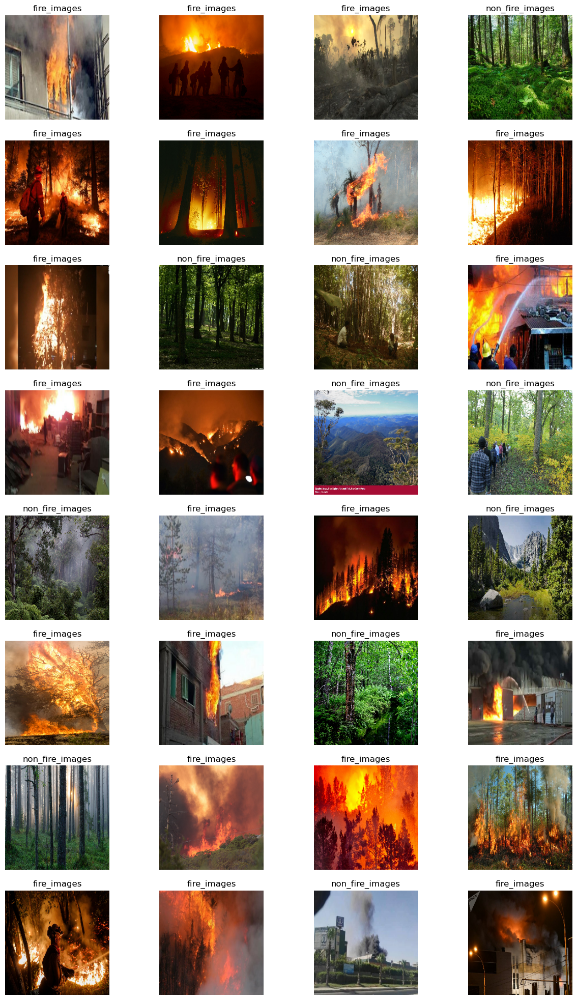

In [7]:
plt.figure(figsize=(15, 25))
for images, labels in train.take(1):
    for i in range(32):
        ax = plt.subplot(8, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

load the VGG16 from tenserflow with input shape 224 X 224 X 3  

create our  model  by add a layer fully connected with 5 neurons and  sigmoid activation


In [24]:
vgg16 = tf.keras.applications.VGG16(input_shape=(224,224,3),include_top=False,weights='imagenet')
vgg16.trainable = False
x = Flatten()(vgg16.output) 
x = Dense(4, activation='sigmoid')(x)  
output = Dense(2, activation='softmax')(x)  
model = Model(inputs=vgg16.input, outputs=output) 

model.summary()  # desplay the model summary

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 4)              │       100,356 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 2)              │            10 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,815,054 (56.51 MB)

 Trainable params: 100,366 (392.05 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

complie the model 

In [25]:


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


training the model with the following parameters and we add a Early stopping callback to the model to reduce overfitting problems

In [26]:
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Entraîner le modèle
history = model.fit(train, validation_data=validation, epochs=6,callbacks=[early_stopping_callback])


Epoch 1/6
25/25 ━━━━━━━━━━━━━━━━━━━━ 116s 5s/step - accuracy: 0.7957 - loss: 0.4256 - val_accuracy: 0.9447 - val_loss: 0.2204
Epoch 2/6
25/25 ━━━━━━━━━━━━━━━━━━━━ 155s 6s/step - accuracy: 0.9340 - loss: 0.2199 - val_accuracy: 0.9598 - val_loss: 0.2066
Epoch 3/6
25/25 ━━━━━━━━━━━━━━━━━━━━ 156s 6s/step - accuracy: 0.9369 - loss: 0.2100 - val_accuracy: 0.9698 - val_loss: 0.1583
Epoch 4/6
25/25 ━━━━━━━━━━━━━━━━━━━━ 157s 6s/step - accuracy: 0.9446 - loss: 0.1890 - val_accuracy: 0.9749 - val_loss: 0.1416
Epoch 5/6
25/25 ━━━━━━━━━━━━━━━━━━━━ 153s 6s/step - accuracy: 0.9568 - loss: 0.1486 - val_accuracy: 0.9849 - val_loss: 0.1401
Epoch 6/6
25/25 ━━━━━━━━━━━━━━━━━━━━ 120s 5s/step - accuracy: 0.9715 - loss: 0.1261 - val_accuracy: 0.9799 - val_loss: 0.1074


 plot  the training and validation loss by epoch

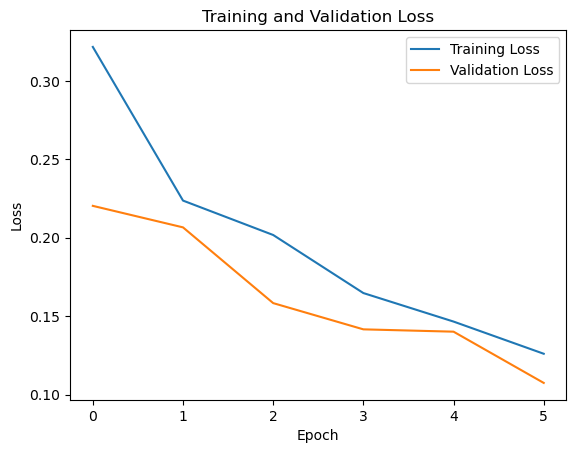

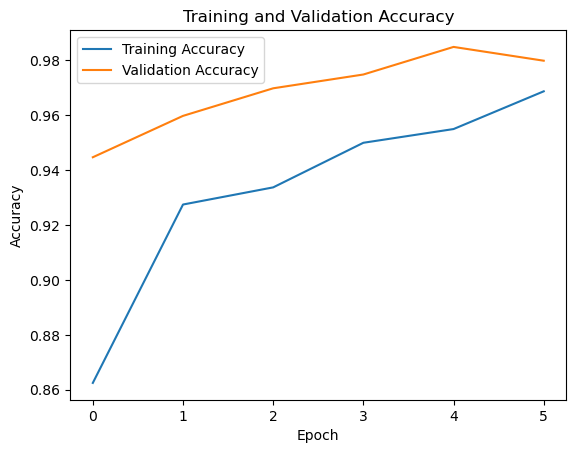

In [27]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

evualate the model in data validation

In [28]:

score, acc = model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9873 - loss: 0.1001
Test Loss = 0.1085069328546524
Test Accuracy = 0.979899525642395


In [29]:


# Save the history to disk as a JSON file
with open('training_history_v2.json', 'w') as file:
    json.dump(history.history, file)

save the history of training  it may be using later 

save the model 

In [ ]:
# Load the saved history from disk
with open('training_history_v1.json', 'r') as file:
    loaded_history = json.load(file)


In [30]:
model.save('fire_detection_v1.keras')

predicte tha data validation and plote it

In [31]:
X,y=[],[]
for images, labels in validation:
    y.extend(labels.numpy())
    X.extend(images.numpy())
predictions=model.predict(np.array(X))
y_pred= np.argmax(predictions, axis=1)





7/7 ━━━━━━━━━━━━━━━━━━━━ 26s 4s/step


In [120]:
# Afficher les classes prédites pour chaque prédiction
print("Classes prédites :", y_pred)

Classes prédites : [0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 0 1
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 1 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 1 0 1 0
 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 1]


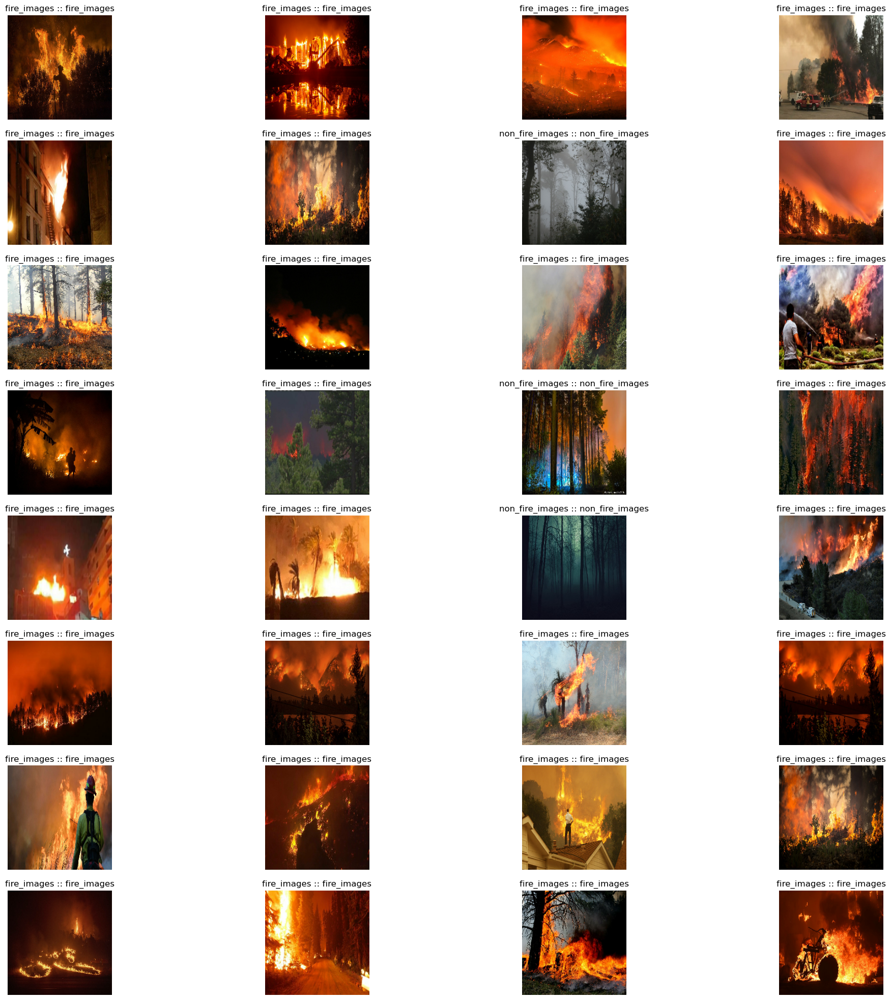

In [32]:
plt.figure(figsize=(25,25))
for i in range(32,64):
    ax = plt.subplot(8, 4, i + 1-32)
    plt.imshow(X[i].astype("uint8"))
    plt.title(f'{class_names[y[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

load the model from the disk and use it to predict for testing only

In [123]:
loaded_model = tf.keras.models.load_model('fire_detection_v1.keras')

In [ ]:
X,y=[],[]
for images, labels in validation:
    y.extend(labels.numpy())
    X.extend(images.numpy())
predictions=loaded_model.predict(np.array(X))
y_pred= np.argmax(predictions, axis=1)

7/7 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step


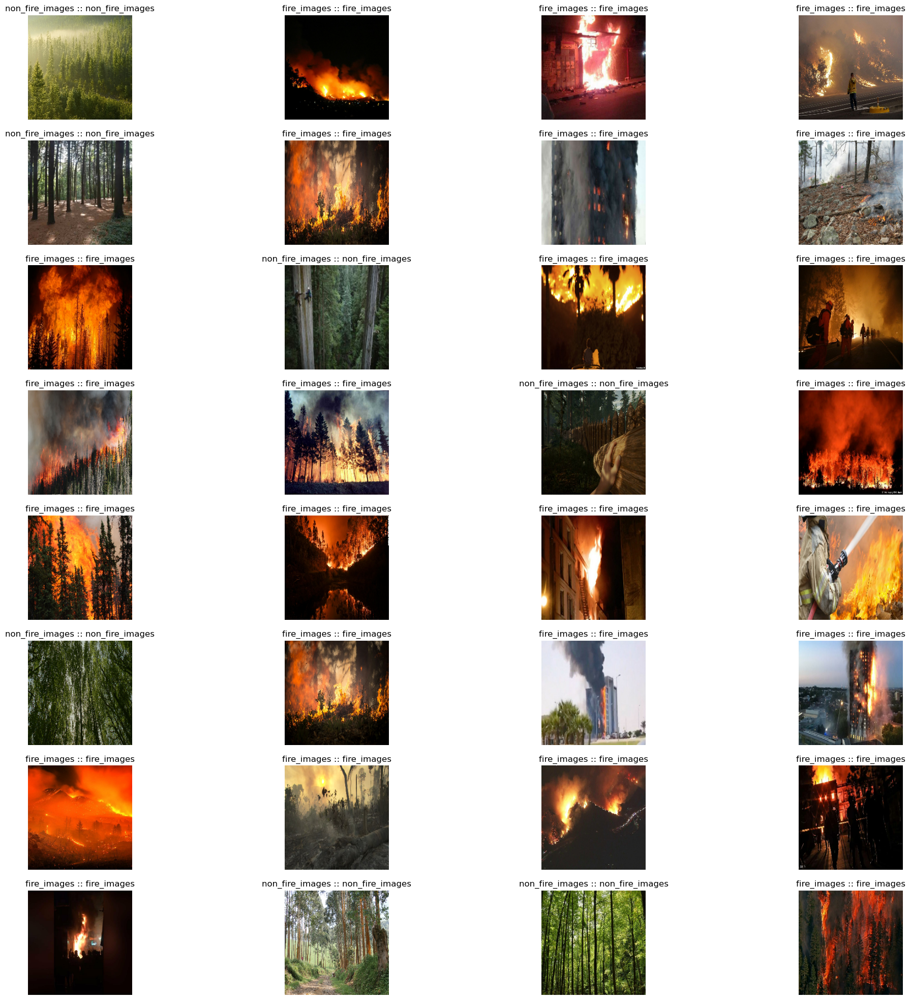

In [124]:
plt.figure(figsize=(25,25))
for i in range(32,64):
    ax = plt.subplot(8, 4, i + 1-32)
    plt.imshow(X[i].astype("uint8"))
    plt.title(f'{class_names[y[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")